In [1]:
# Import our libraries
import altair
import requests
import pandas
import geopandas
import json

In [2]:
altair.renderers.enable('notebook')
altair.themes.enable('opaque')

ThemeRegistry.enable('opaque')

In [3]:
def read_json_file(path):
    '''Reads JSON file and Returns JSON'''
    with open(path, 'r') as json_file:
        return json.load(json_file)

In [4]:
# Read geojson from file
subdistricts_geojson = read_json_file('maps_data/municipal_road.geojson')

# Load our GeoJSON into a GeoPandas GeoDataFrame
geodataframe = geopandas.GeoDataFrame.from_features((subdistricts_geojson))
geodataframe.head(3)

,Length,Link,geometry
0,9.153930,Hatubuilico (C22C25) - Nunumogue,(LINESTRING Z (117123.3122779502 9014355.00849...
1,28.766068,Lacluta (A3) - Korlule (A11),(LINESTRING Z (78794.51204326958 9009972.84448...
2,11.501891,Ermera Villa (A02) - Fatubolo,(LINESTRING Z (98516.41550340626 9031123.66327...


In [5]:
# Read geojson from file
subdistricts_geojson = read_json_file('maps_data/subdistricts_full.geojson')

# Load our GeoJSON into a GeoPandas GeoDataFrame
geodataframe = geopandas.GeoDataFrame.from_features((subdistricts_geojson))
geodataframe.head(3)

,NEWSBDCODE,SUBDISTR,Shape_Area,Shape_Leng,geometry
0,201,AILEU VILA,0.025769,0.941802,POLYGON ((125.5118179317913 -8.843150138739759...
1,101,AINARO,0.019322,0.721927,POLYGON ((125.5552215574578 -9.023679733534662...
2,1002,ALAS,0.033329,0.999681,POLYGON ((125.9424285890088 -9.132920265320477...


In [6]:
merge_road_geodataframe = geodataframe.merge(geodataframe, on='Shape_Area', how='inner')
merge_road_geodataframe.head(3)

,NEWSBDCODE_x,SUBDISTR_x,Shape_Area,Shape_Leng_x,geometry_x,NEWSBDCODE_y,SUBDISTR_y,Shape_Leng_y,geometry_y
0,201,AILEU VILA,0.025769,0.941802,POLYGON ((125.5118179317913 -8.843150138739759...,201,AILEU VILA,0.941802,POLYGON ((125.5118179317913 -8.843150138739759...
1,101,AINARO,0.019322,0.721927,POLYGON ((125.5552215574578 -9.023679733534662...,101,AINARO,0.721927,POLYGON ((125.5552215574578 -9.023679733534662...
2,1002,ALAS,0.033329,0.999681,POLYGON ((125.9424285890088 -9.132920265320477...,1002,ALAS,0.999681,POLYGON ((125.9424285890088 -9.132920265320477...


In [7]:
merge_road_geodataframe['centroid_lon'] = merge_road_geodataframe['geometry'].centroid.x
merge_road_geodataframe['centroid_lat'] = merge_road_geodataframe['geometry'].centroid.y
merge_road_geodataframe.head(3)

KeyError: 'geometry'

In [8]:
choro_json = json.loads(geodataframe.to_json())
choro_data = altair.Data(values=choro_json['features'])

In [9]:
geojson = json.loads(geodataframe.to_json())
geojson = geojson['features']

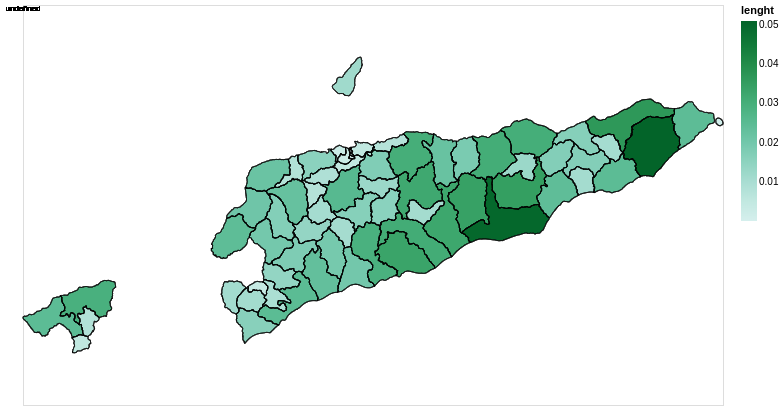

In [10]:
def generate_base(geojson, color_column, legend_title):
    
    '''Generates baselayer of DC ANC map'''
    data = altair.Data(values=geojson)
    choropleth = altair.Chart(data).mark_geoshape(
        fill='lightgray',
        stroke='black',
        strokeWidth=1
    ).encode(
        altair.Color(color_column,  # change the color based on this column's values
        type='quantitative', 
        scale=altair.Scale(scheme='bluegreen'),
        title=legend_title)
    )
    
    base = altair.Chart(altair.Data(values=geojson)).mark_geoshape(
        stroke='bluegrey',
        strokeWidth=1
    ).encode(
    ).properties(
        width=700,
        height=400
    )
    
     # Add Labels Layer
    labels = altair.Chart(choro_data).mark_text(baseline='top'
     ).properties(
        width=400,
        height=400
     ).encode(
         longitude='properties.centroid_lon:Q',
         latitude='properties.centroid_lat:Q',
         text='properties.Link:O',
         size=altair.value(8),
         opacity=altair.value(1)
     )
    return choropleth + base + labels

base_layer = generate_base(geojson=geojson, color_column='properties.Shape_Area', legend_title="lenght")
base_layer 

## Saving a Pandas Dataframe as a CSV

In [11]:
from_geodataframe_to_csv = pandas.DataFrame(road_geodataframe)
from_geodataframe_to_csv.to_csv(r'maps_data/roads.csv')
from_geodataframe_to_csv.head(3)

NameError: name 'road_geodataframe' is not defined